In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
import seaborn as sns
import numpy as np
import folium
from datetime import datetime

ModuleNotFoundError: No module named 'seaborn'

In [ ]:
# Load datasets
temp_df = pd.read_csv(r"C:\Users\ash\Desktop\tranzmeo\temperature.csv")
binsize_df = pd.read_csv(r"C:\Users\ash\Desktop\tranzmeo\BinSize.csv")

In [ ]:
# Convert date column to datetime format
temp_df['Date'] = pd.to_datetime(temp_df['Date'], format='%Y-%m-%d')

In [ ]:
# Extract year and month-day for processing
temp_df['year'] = temp_df['Date'].dt.year
temp_df['month_day'] = temp_df['Date'].dt.strftime('%m-%d')

In [ ]:
# Remove leap day (Feb 29)
temp_df = temp_df[temp_df['month_day']!='02-29']

In [ ]:
# Split data into historical (2005-2014) and 2015
temp_hist = temp_df[(temp_df['year'] >= 2005) & (temp_df['year'] <= 2014)]
temp_2015 = temp_df[temp_df['year'] == 2015]

In [ ]:
# Compute record high and low temperatures over 2005-2014
record_highs = temp_hist[temp_hist['Element'] == 'TMAX'].groupby('month_day')['Data_Value'].max()
record_lows = temp_hist[temp_hist['Element'] == 'TMIN'].groupby('month_day')['Data_Value'].min()

In [ ]:
# Identify 2015 values that broke records
highs_2015 = temp_2015[temp_2015['Element'] == 'TMAX'].groupby('month_day')['Data_Value'].max()
lows_2015 = temp_2015[temp_2015['Element'] == 'TMIN'].groupby('month_day')['Data_Value'].min()

highs_broken = highs_2015[highs_2015 > record_highs]
lows_broken = lows_2015[lows_2015 < record_lows]

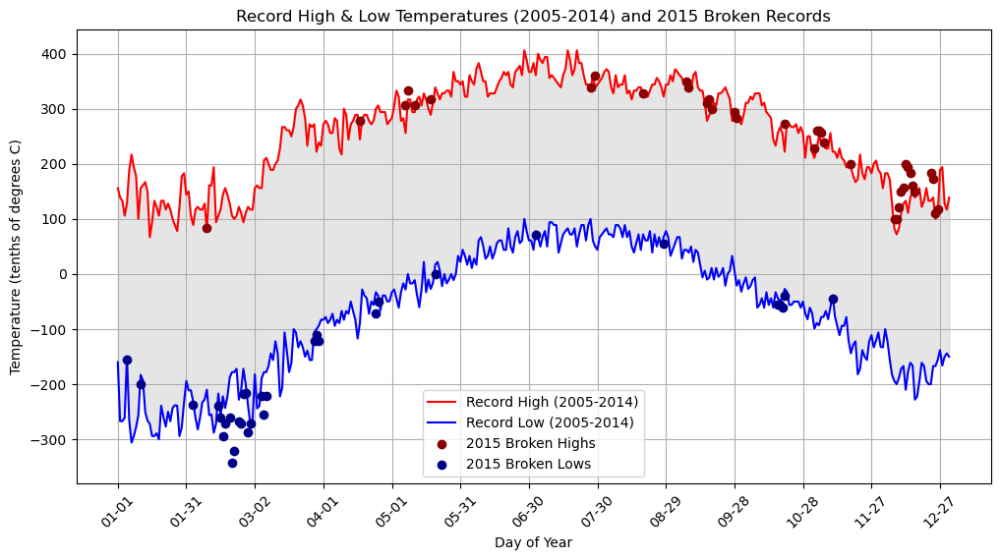

In [ ]:
# Plot the graph
plt.figure(figsize=(12, 6))
plt.plot(record_highs.index, record_highs.values, label='Record High (2005-2014)', color='red')
plt.plot(record_lows.index, record_lows.values, label='Record Low (2005-2014)', color='blue')
plt.scatter(highs_broken.index, highs_broken.values, color='darkred', label='2015 Broken Highs', zorder=3)
plt.scatter(lows_broken.index, lows_broken.values, color='darkblue', label='2015 Broken Lows', zorder=3)
plt.fill_between(record_highs.index, record_highs.values, record_lows.values, color='gray', alpha=0.2)
plt.xticks(ticks=record_highs.index[::30], rotation=45)  # Show every 30th day (approx. 1 per month)
plt.xlabel('Day of Year')
plt.ylabel('Temperature (tenths of degrees C)')
plt.title('Record High & Low Temperatures (2005-2014) and 2015 Broken Records')
plt.legend()
plt.grid(True)
plt.show()

In [ ]:
# Plot station locations on a map
map_center = [42.2808, -83.7430]  # Ann Arbor, MI
map_ = folium.Map(location=map_center, zoom_start=8)
folium.Marker(location=map_center, popup='Ann Arbor, MI', icon=folium.Icon(color='blue')).add_to(map_)
map_.save("map.html")

In [ ]:
# Filter Ann Arbor 2015 data and summarize
temp_aa_2015 = temp_2015[(temp_2015['year'] == 2015)]
temp_summary = temp_aa_2015.groupby('Element')['Data_Value'].describe()
print(temp_summary)

          count        mean         std    min   25%    50%    75%    max
Element                                                                  
TMAX     6920.0  152.353757  118.565319 -161.0  67.0  172.0  256.0  361.0
TMIN     6837.0   36.380869  112.304507 -343.0 -33.0   50.0  133.0  244.0


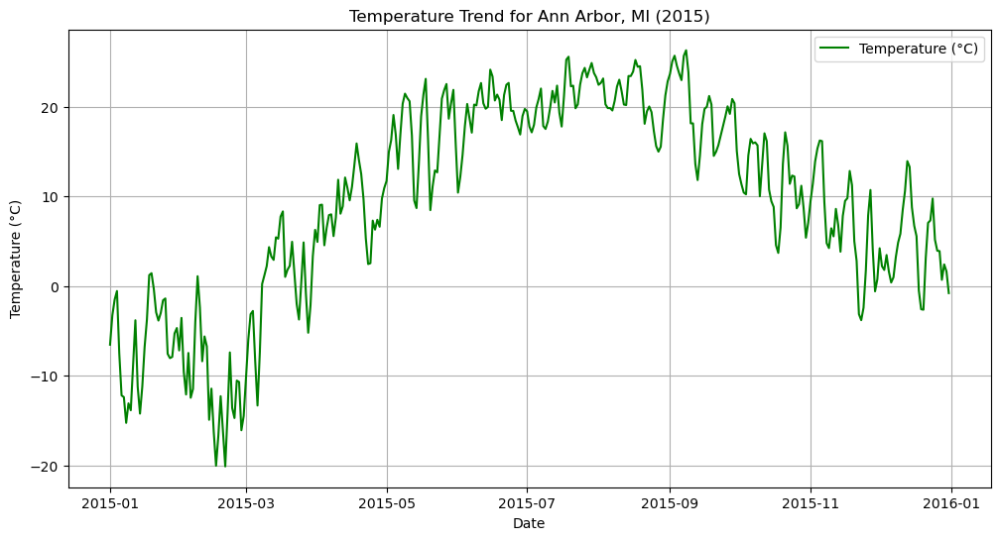

In [ ]:
ann_arbor_2015 = temp_df[temp_df['Date'].dt.year == 2015].copy()

# Convert 'Data_Value' to numeric and scale
ann_arbor_2015['Data_Value'] = pd.to_numeric(ann_arbor_2015['Data_Value'], errors='coerce') / 10

# Drop NaN values
ann_arbor_2015.dropna(subset=['Data_Value'], inplace=True)

# group by Date
ann_arbor_2015 = ann_arbor_2015.groupby('Date')['Data_Value'].mean()

# Plot
plt.figure(figsize=(12, 6))
plt.plot(ann_arbor_2015.index, ann_arbor_2015, label="Temperature (°C)", color='green')

plt.xlabel("Date")
plt.ylabel("Temperature (°C)")
plt.title("Temperature Trend for Ann Arbor, MI (2015)")
plt.legend()
plt.grid(True)
plt.show()

In [ ]:
ann_arbor_2015 = ann_arbor_2015.drop_duplicates()

In [ ]:
print(ann_arbor_2015.duplicated().sum())  # Check duplicate entries

0


In [ ]:
print(ann_arbor_2015.head())  # Ensure data is correctly filtered

Date
2015-01-01   -6.530556
2015-01-02   -3.251351
2015-01-03   -1.497222
2015-01-04   -0.545000
2015-01-05   -7.489474
Name: Data_Value, dtype: float64


In [ ]:
from folium.plugins import MarkerCluster
# Create a map centered on Ann Arbor
ann_arbor_map = folium.Map(location=[42.2808, -83.7430], zoom_start=10)
# Add Marker Clustering
marker_cluster = MarkerCluster().add_to(ann_arbor_map)
# Loop through the data and add markers
for _, row in binsize_df.iterrows():
    folium.Marker([row['LATITUDE'], row['LONGITUDE']], popup=row.get('ID')).add_to(marker_cluster)
# Display the map
ann_arbor_map

In [ ]:
# Save summary to CSV
temp_summary.to_csv("AnnArbor_2015_Temperature_Summary.csv")